In [1]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import Video
import tempfile
import os
import shutil
import glob
import tqdm
import pandas as pd
from tint import Cell_tracks, animate
from tint.visualization import embed_mp4_as_gif
from scipy.ndimage import gaussian_filter
from skimage.measure import regionprops
from load_radar import load_radar
import datetime as dt

def read_aws_vic(stn_id, times):
    print("Reading "+stn_id+"...")
    df=pd.read_csv(glob.glob("/g/data/eg3/ab4502/ExtremeWind/obs/aws/vic_one_min_gust/HD01D_Data_"+stn_id+"*.txt")[0], names=["hd","no","dt_lt","dt_utc","gust","q","#"],header=0)
    df["dt_utc"] = pd.to_datetime(df["dt_utc"], format="%Y%m%d%H%M")
    df = df.set_index("dt_utc")
    df["gust"] = pd.to_numeric(df["gust"], errors="coerce")    
    return df.loc[slice(times[0], times[1])]


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [5]:
Video("/g/data/eg3/ab4502/figs/tint/02_20150228.mp4", embed=True, width=600, height=500)

Reading 087113...
Reading 087184...
Reading 087168...


[<AxesSubplot:xlabel='dt_utc'>,
 <AxesSubplot:xlabel='dt_utc'>,
 <AxesSubplot:xlabel='dt_utc'>]

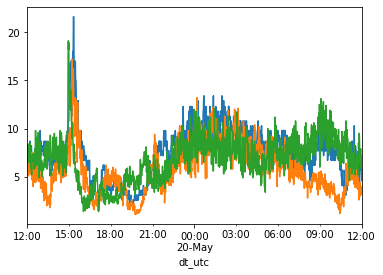

In [43]:
dfs = [read_aws_vic(i, ["2020-05-19 12:00", "2020-05-20 12:00"]) for i in ["087113", "087184", "087168"]]
[x["gust"].plot() for x in dfs]


In [3]:
Video("/g/data/eg3/ab4502/figs/tint/02_20200131.mp4", embed=True, width=800, height=600)

Reading 087168...
Reading 090035...


[<AxesSubplot:xlabel='dt_utc'>, <AxesSubplot:xlabel='dt_utc'>]

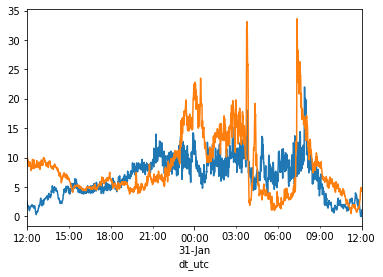

In [2]:
dfs = [read_aws_vic(i, ["2020-01-30 12:00", "2020-01-31 12:00"]) for i in ["087168", "090035"]]
[x["gust"].plot() for x in dfs]


In [44]:
pd.read_csv("/g/data/eg3/ab4502/figs/tint/02_20200131.csv").query("uid==0")

,scan,uid,time,grid_x,grid_y,lon,lat,area_km,vol,field_max,...,local_max,azi_shear36,azi_shear02,eccentricity,major_axis_length,minor_axis_length,bbox,angle,speed,speed_inst
0,0,0,2020-01-31 03:00:28,15.500,65.500,143.5015,-37.7105,25.00,28.125,30.558001,...,0,1.469,0.688,0.000,5.000,5.000,"(65, 15, 67, 17)",153.136,23.605,21.408
2,1,0,2020-01-31 03:12:28,18.286,60.000,143.5562,-37.8460,43.75,115.625,32.161999,...,0,2.984,1.781,0.378,7.559,6.999,"(59, 17, 62, 20)",153.872,23.605,23.119
4,2,0,2020-01-31 03:24:28,21.364,53.545,143.6395,-37.9817,68.75,140.625,32.967999,...,0,2.391,3.219,0.498,10.000,8.672,"(52, 20, 56, 24)",153.953,23.605,24.569
5,3,0,2020-01-31 03:36:30,24.500,47.286,143.7229,-38.1398,87.50,200.000,33.278000,...,0,1.961,2.188,0.204,10.522,10.302,"(46, 23, 50, 27)",151.481,23.605,23.929
8,4,0,2020-01-31 03:48:28,27.941,41.441,143.8355,-38.2756,212.50,784.375,36.555000,...,1,3.109,2.281,0.689,19.451,14.104,"(39, 25, 45, 32)",144.335,23.605,25.557
11,5,0,2020-01-31 04:00:31,33.053,35.368,143.9773,-38.4115,118.75,340.625,33.183998,...,0,1.945,2.992,0.682,14.266,10.438,"(33, 31, 38, 36)",141.884,23.605,24.823
14,6,0,2020-01-31 04:12:31,36.760,30.200,144.0910,-38.5247,156.25,590.625,35.058998,...,1,1.688,2.508,0.537,15.330,12.932,"(28, 34, 33, 40)",146.787,23.605,21.937
15,7,0,2020-01-31 04:24:28,39.968,24.806,144.1763,-38.6375,193.75,725.000,34.488998,...,0,1.688,1.602,0.747,19.257,12.807,"(22, 37, 28, 44)",140.218,23.605,21.867
16,8,0,2020-01-31 04:36:30,44.720,20.640,144.3197,-38.7281,156.25,443.750,31.862000,...,0,1.047,2.609,0.935,24.048,8.537,"(18, 41, 24, 49)",137.253,23.605,22.198
17,9,0,2020-01-31 04:48:28,48.600,15.467,144.4344,-38.8633,93.75,250.000,31.180000,...,0,0.523,1.570,0.926,17.647,6.644,"(14, 46, 18, 52)",143.128,23.605,22.453


In [6]:
Video("/g/data/eg3/ab4502/figs/tint/02_20110204.mp4", embed=True, width=600, height=500)

In [3]:
pd.read_csv("/g/data/eg3/ab4502/figs/tint/02_20200131.csv").query("uid==0")

,scan,uid,time,grid_x,grid_y,lon,lat,area_km,vol,max,max_alt,isolated,local_max,eccentricity,major_axis_length,minor_axis_length,bbox,angle,speed
0,0,0,2020-01-31 03:00:28,15.500,65.500,143.5015,-37.7105,25.00,28.125,30.558111,4.5,False,0,0.000,5.000,5.000,"(65, 15, 67, 17)",153.136,21.408
2,1,0,2020-01-31 03:12:28,18.286,60.000,143.5562,-37.8460,43.75,115.625,32.161991,5.0,False,0,0.378,7.559,6.999,"(59, 17, 62, 20)",153.872,23.118
4,2,0,2020-01-31 03:24:28,21.364,53.545,143.6395,-37.9817,68.75,140.625,32.968258,5.5,True,0,0.498,10.000,8.672,"(52, 20, 56, 24)",153.953,24.567
5,3,0,2020-01-31 03:36:30,24.500,47.286,143.7229,-38.1398,87.50,200.000,33.278332,5.5,False,0,0.204,10.522,10.302,"(46, 23, 50, 27)",151.481,23.906
8,4,0,2020-01-31 03:48:28,27.941,41.441,143.8355,-38.2756,212.50,784.375,36.554630,5.0,False,1,0.689,19.451,14.104,"(39, 25, 45, 32)",144.335,25.270
11,5,0,2020-01-31 04:00:31,33.053,35.368,143.9773,-38.4115,118.75,340.625,33.184425,4.5,False,0,0.682,14.266,10.438,"(33, 31, 38, 36)",141.884,24.518
14,6,0,2020-01-31 04:12:31,36.760,30.200,144.0910,-38.5247,156.25,590.625,35.058594,5.0,True,1,0.537,15.330,12.932,"(28, 34, 33, 40)",146.787,21.895
15,7,0,2020-01-31 04:24:28,39.968,24.806,144.1763,-38.6375,193.75,725.000,34.489315,4.5,True,0,0.747,19.257,12.807,"(22, 37, 28, 44)",140.218,21.405
16,8,0,2020-01-31 04:36:30,44.720,20.640,144.3197,-38.7281,156.25,443.750,31.862122,4.5,True,0,0.935,24.048,8.537,"(18, 41, 24, 49)",137.253,21.714
17,9,0,2020-01-31 04:48:28,48.600,15.467,144.4344,-38.8633,93.75,250.000,31.179663,3.5,True,0,0.926,17.647,6.644,"(14, 46, 18, 52)",143.128,22.409


In [8]:
Video("/g/data/eg3/ab4502/figs/tint/71_20151215.mp4", embed=True, width=800, height=600)

In [7]:
pd.read_csv("/g/data/eg3/ab4502/figs/tint/71_20151215.csv").query("uid==3")

,scan,uid,time,grid_x,grid_y,lon,lat,area_km,vol,field_max,...,local_max,azi_shear36,azi_shear02,eccentricity,major_axis_length,minor_axis_length,bbox,angle,speed,speed_inst
3,0,3,2015-12-15 23:01:02,59.110,36.084,151.1822,-34.2404,1418.75,9515.625,50.021999,...,1,NaN,NaN,0.659,50.993,38.353,"(30, 48, 46, 69)",32.38,7.664,7.664
10,1,3,2015-12-15 23:13:02,60.292,37.948,151.2094,-34.1954,1456.25,8896.875,48.930000,...,1,NaN,NaN,0.429,46.716,42.206,"(31, 50, 47, 70)",32.38,7.664,7.664


In [7]:
Video("/g/data/eg3/ab4502/figs/tint/02_20111225.mp4", embed=True, width=600, height=500)

In [5]:
pd.read_csv("/g/data/eg3/ab4502/figs/tint/02_20111225.csv").query("uid==3")

,scan,uid,time,grid_x,grid_y,lon,lat,area_km,vol,field_max,...,local_max,azi_shear36,azi_shear02,eccentricity,major_axis_length,minor_axis_length,bbox,angle,speed,speed_inst
6,22,3,2011-12-25 04:24:23,22.111,66.222,143.6755,-37.7155,112.50,596.875,35.337002,...,1,4.453,1.148,0.761,14.914,9.675,"(65, 20, 69, 26)",133.509,14.104,10.083
8,23,3,2011-12-25 04:36:35,24.220,64.220,143.7317,-37.7609,256.25,1618.750,40.255001,...,1,6.383,3.578,0.709,21.656,15.283,"(62, 21, 68, 29)",125.904,14.104,11.594
11,24,3,2011-12-25 04:48:24,27.491,62.327,143.8164,-37.8066,343.75,1906.250,40.244999,...,1,6.188,3.828,0.549,23.130,19.335,"(59, 24, 67, 33)",112.388,14.104,14.043
13,25,3,2011-12-25 05:00:35,31.651,61.159,143.9585,-37.8301,393.75,2293.750,39.889000,...,1,19.258,6.148,0.529,24.581,20.858,"(57, 28, 66, 37)",103.275,14.104,14.955
16,26,3,2011-12-25 05:12:24,35.879,60.348,144.0721,-37.8533,412.50,3087.500,42.193001,...,1,11.164,6.125,0.547,25.503,21.347,"(56, 31, 65, 41)",92.269,14.104,14.278
19,27,3,2011-12-25 05:24:35,39.779,60.837,144.1862,-37.8314,537.50,4125.000,46.993999,...,1,13.961,12.148,0.715,31.327,21.902,"(56, 35, 67, 46)",87.519,14.104,12.946
22,28,3,2011-12-25 05:36:24,43.312,60.670,144.2716,-37.8318,700.00,5359.375,49.313999,...,1,10.383,7.188,0.722,36.118,24.996,"(55, 37, 67, 50)",89.129,14.104,12.224
25,29,3,2011-12-25 05:48:35,46.815,60.944,144.3854,-37.8322,775.00,5950.000,50.391998,...,1,9.922,6.430,0.769,39.373,25.162,"(55, 41, 68, 54)",81.854,14.104,12.578
28,30,3,2011-12-25 06:00:25,50.480,61.696,144.4709,-37.8100,781.25,5612.500,49.574001,...,1,12.312,10.391,0.697,37.451,26.839,"(56, 45, 69, 58)",81.334,14.104,14.342
32,31,3,2011-12-25 06:12:36,54.984,62.189,144.6132,-37.8102,793.75,5437.500,48.415001,...,1,12.391,11.062,0.686,37.761,27.473,"(56, 49, 70, 62)",88.153,14.104,14.840


In [7]:
Video("/g/data/eg3/ab4502/figs/tint/08_20061216.mp4", embed=True, width=800, height=600)

In [6]:
pd.read_csv("/g/data/eg3/ab4502/figs/tint/43_20061216.csv").query("uid==0")

,scan,uid,time,grid_x,grid_y,lon,lat,area_km,vol,field_max,...,local_max,azi_shear36,azi_shear02,eccentricity,major_axis_length,minor_axis_length,bbox,angle,speed,speed_inst
0,0,0,2006-12-16 06:21:11,45.714,78.218,152.7768,-26.9869,7006.25,36700.000,47.520000,...,3,NaN,NaN,0.981,293.539,56.575,"(40, 7, 112, 91)",29.449,10.278,13.221
1,1,0,2006-12-16 06:31:11,47.274,80.981,152.8022,-26.9195,7568.75,41156.250,49.035999,...,5,NaN,NaN,0.982,295.293,55.512,"(41, 9, 115, 92)",45.773,10.278,13.410
2,2,0,2006-12-16 06:41:11,50.146,82.532,152.8780,-26.8747,8068.75,43365.625,49.356998,...,6,NaN,NaN,0.983,296.716,54.077,"(43, 9, 118, 95)",58.179,10.278,13.703
3,3,0,2006-12-16 06:51:11,52.853,84.443,152.9536,-26.8523,8268.75,44787.500,49.855999,...,6,NaN,NaN,0.983,293.053,54.408,"(45, 12, 121, 98)",43.421,10.278,12.649
4,4,0,2006-12-16 07:01:11,54.221,86.838,152.9789,-26.7849,8281.25,43806.250,51.103001,...,5,NaN,NaN,0.974,271.762,61.293,"(48, 15, 121, 100)",35.374,10.278,10.798
5,5,0,2006-12-16 07:11:11,55.837,88.646,153.0293,-26.7400,8218.75,43262.500,49.735001,...,4,NaN,NaN,0.954,235.435,70.518,"(50, 21, 121, 100)",50.617,10.278,9.787
6,6,0,2006-12-16 07:21:11,57.806,89.781,153.0797,-26.7175,8468.75,44462.500,52.838001,...,4,NaN,NaN,0.924,209.188,79.922,"(51, 32, 121, 101)",44.698,10.278,9.566
7,7,0,2006-12-16 07:31:11,58.954,91.796,153.1048,-26.6725,8068.75,41400.000,52.688999,...,5,NaN,NaN,0.890,181.300,82.797,"(56, 36, 121, 94)",35.741,10.278,9.386
9,8,0,2006-12-16 07:41:11,60.422,93.416,153.1300,-26.6501,7668.75,38256.250,48.023998,...,5,NaN,NaN,0.875,162.573,78.572,"(68, 37, 121, 87)",84.530,10.278,10.859
11,9,0,2006-12-16 07:51:11,63.194,92.202,153.2055,-26.6725,7543.75,35443.750,46.294998,...,4,NaN,NaN,0.877,166.415,80.078,"(64, 37, 121, 89)",115.574,10.278,13.095


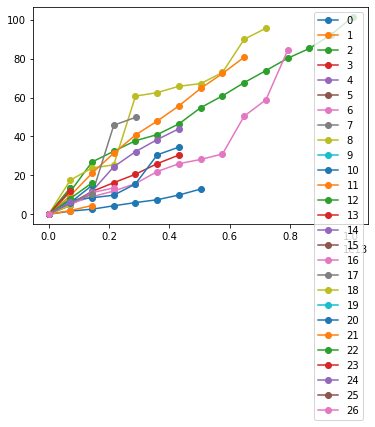

In [4]:
def calc_speed_and_dir(df, dx):
    """From a pandas dataframe, use the grid_x, grid_y and time to calculate speed and 
    direction. Use central finite difference for both speed and direction"""
    if df.shape[0] > 1:
        x, y, t0 = (df["grid_x"].values, df["grid_y"].values, df["time"].iloc[0])
        dist = np.cumsum(np.concatenate(([0], [np.sqrt(np.square(x[i-1] - x[i]) + np.square(y[i-1] - y[i]))  for i in np.arange(1, len(x))]))) 
        #dist = np.array(np.sqrt(np.square(x0-df["grid_x"]) + \
        #            np.square(y0-df["grid_y"])))
        times = pd.to_datetime(df["time"]) - t0
        delta_t = (times / np.arange(df.shape[0])).mean().seconds
        speed = np.gradient(dist * dx, delta_t)
        angles = []
        for i in np.arange(df.shape[0]):
            if i == 0:
                angle = (np.arctan2(df["grid_y"].iloc[i+1] - df["grid_y"].iloc[i], df["grid_x"].iloc[i+1] - df["grid_x"].iloc[i]))
            elif i == df.shape[0]-1:
                angle = (np.arctan2(df["grid_y"].iloc[i] - df["grid_y"].iloc[i-1], df["grid_x"].iloc[i] - df["grid_x"].iloc[i-1]))
            else:
                angle = (np.arctan2(df["grid_y"].iloc[i+1] - df["grid_y"].iloc[i-1], df["grid_x"].iloc[i+1] - df["grid_x"].iloc[i-1]))
            angles.append((90 - ( (180/np.pi) * angle ) + 360) % 360)
        df["angle"] = np.round(angles, 3)
        df["speed"] = np.round(speed, 3)
    else:
        df["angle"] = np.nan
        df["speed"] = np.nan
    return df

def moving_average_3(a):
    out = []
    if len(a) > 1:
        for i in np.arange(len(a)):
            if i == 0:
                out.append((a[0] + a[1])/2.)
            elif i == (len(a) - 1):
                out.append((a[-1] + a[-2])/2.)
            else:
                out.append((a[i-1] + a[i] + a[i+1])/3.)                
    else:
        out.append(a[0])
    return np.array(out)

df = pd.read_csv("/g/data/eg3/ab4502/figs/tint/71_20151215.csv")
for uid in np.arange(df["uid"].max()):
    df2 = df.query("uid=="+str(uid)).copy()
    df2["time"] = pd.to_datetime(df2["time"])
    df2 = df2.groupby("uid").apply(calc_speed_and_dir, dx=2500)

    dx=2500
    x, y, t0 = (df2["grid_x"].values, df2["grid_y"].values, df2["time"].iloc[0])
    dist = np.cumsum(np.concatenate(([0], [np.sqrt(np.square(x[i-1] - x[i]) + np.square(y[i-1] - y[i]))  for i in np.arange(1, len(x))])))
    times = pd.to_datetime(df2["time"]) - t0
    delta_t = (times / np.arange(df2.shape[0])).mean().seconds
    try:
        speed = np.gradient(dist * dx, delta_t)
    except:
        speed = np.nan
    plt.plot(times, dist * dx / 1000, label=str(uid), marker="o")
plt.legend()

[16.20354121 18.67281601 14.41573353  7.59766084  5.93885726  6.017785
  9.60099324  9.98831608  8.94776182  8.99959769  8.68337693  7.90585348
  8.42619616 11.33191349 12.79850608] 
 [9.19180099 9.19180099 9.19180099 9.19180099 9.19180099 9.19180099
 9.19180099 9.19180099 9.19180099 9.19180099 9.19180099 9.19180099
 9.19180099 9.19180099 9.19180099]


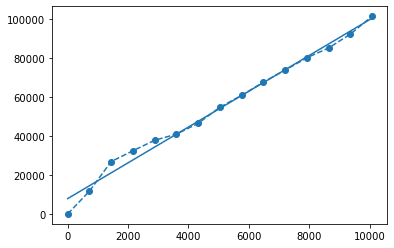

In [10]:
uid=2
deg=1

df2 = df.query("uid=="+str(uid)).copy()
df2["time"] = pd.to_datetime(df2["time"])
df2 = df2.groupby("uid").apply(calc_speed_and_dir, dx=2500)

dx=2500
x, y, t0 = (df2["grid_x"].values, df2["grid_y"].values, df2["time"].iloc[0])
dist = np.cumsum(np.concatenate(([0], [np.sqrt(np.square(x[i-1] - x[i]) + np.square(y[i-1] - y[i]))  for i in np.arange(1, len(x))])))
times = pd.to_datetime(df2["time"]) - t0
delta_t = (times / np.arange(df2.shape[0])).mean().seconds
try:
    speed = np.gradient(dist * dx, delta_t)
except:
    speed = np.nan
    
yp = dist*dx
xp = np.array([t.seconds for t in times])

plt.plot(xp, yp, label=str(uid), ls="--", marker="o")

fit = np.polyfit(xp, yp, deg=deg)

xr = np.arange(0, xp[-1]+1, 1)
yr = np.polyval(fit, xr)
#yr[0] = 0
plt.plot(xp, np.polyval(fit, xp), label=str(uid), color="tab:blue")

print(np.gradient(dist * dx, delta_t), "\n",np.gradient(yr, 1)[xp])

[ 7.55032706  6.28694734  4.5412383   4.68000267  6.95970642  7.1126686
  4.31080079  3.44930357 15.46815687 19.34840323 23.5063443  35.36816958] 
 [ 5.71344887  5.71344887  5.71344887  5.71344887  5.71344887  5.71344887
 15.96493706 15.98714142 15.9982436  15.98714142 15.98714142 15.98714142]


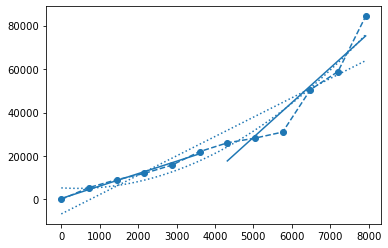

In [314]:
uid=6
deg=1

df2 = df.query("uid=="+str(uid)).copy()
df2["time"] = pd.to_datetime(df2["time"])
df2 = df2.groupby("uid").apply(calc_speed_and_dir, dx=2500)

dx=2500
x, y, t0 = (df2["grid_x"].values, df2["grid_y"].values, df2["time"].iloc[0])
dist = np.cumsum(np.concatenate(([0], [np.sqrt(np.square(x[i-1] - x[i]) + np.square(y[i-1] - y[i]))  for i in np.arange(1, len(x))])))
times = pd.to_datetime(df2["time"]) - t0
delta_t = (times / np.arange(df2.shape[0])).mean().seconds
try:
    speed = np.gradient(dist * dx, delta_t)
except:
    speed = np.nan

yp = dist*dx
xp = np.array([t.seconds for t in times])    
plt.plot(xp, yp, label=str(uid), ls="--", marker="o")

deg=2
fit = np.polyfit(xp, yp, deg=deg)
xr = np.arange(0, xp[-1]+1, 1)
yr = np.polyval(fit, xr)
plt.plot(xr, yr, label=str(uid), color="tab:blue", ls=":")

deg=1
fit = np.polyfit(xp, yp, deg=deg)
xr = np.arange(0, xp[-1]+1, 1)
yr = np.polyval(fit, xr)
plt.plot(xr, yr, label=str(uid), color="tab:blue", ls=":")

mins=60
xchunks = np.array_split(xp, len(xp) / int(np.ceil((mins*60) / delta_t)))
ychunks = np.array_split(yp, len(yp) / int(np.ceil((mins*60) / delta_t)))
speed_out = []
for xchunk, ychunk in zip(xchunks, ychunks):
    fit = np.polyfit(xchunk, ychunk, deg=deg)

    yr = np.polyval(fit, xchunk)
    plt.plot(xchunk, yr, label=str(uid), color="tab:blue")
    speed_out = np.concatenate((speed_out, np.gradient(yr, delta_t)))
    
print(np.gradient(dist * dx, delta_t), "\n",speed_out)

In [17]:
pd.read_csv("/g/data/eg3/ab4502/figs/tint/71_20151215.csv")[["scan","time","azi_shear36","angle","speed"]]

,scan,time,azi_shear36,angle,speed
0,0,2015-12-15 22:01:02,NaN,331.355,2.458
1,0,2015-12-15 22:01:02,NaN,87.544,6.402
2,0,2015-12-15 22:01:02,7.141,49.528,9.192
3,0,2015-12-15 22:01:02,3.359,121.888,7.018
4,1,2015-12-15 22:13:02,0.000,342.753,2.458
...,...,...,...,...,...
112,14,2015-12-16 00:49:03,5.375,328.435,8.909
113,14,2015-12-16 00:49:03,1.586,74.709,12.323
114,14,2015-12-16 00:49:03,0.000,28.892,11.239
115,14,2015-12-16 00:49:03,0.000,79.269,8.485


In [319]:
len(moving_average(dist, 3))

6

In [318]:
len(dist)

8